# Modelo 10 clases


In [20]:
import tensorflow as tf
import os

In [21]:
Ruta = r"C:/Users/gerar/Desktop/Analizador-de-Textura-main/Modelo2026/47clases"
Imagenes = (128, 128)
Batch = 32

In [22]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    Ruta,
    validation_split=0.2,   # Reservamos el 20% para pruebas
    subset="training",
    seed=123,               # Semilla para que el orden sea reproducible
    image_size=Imagenes,
    batch_size=Batch
)

Found 5546 files belonging to 47 classes.
Using 4437 files for training.


In [23]:
val_ds = tf.keras.utils.image_dataset_from_directory(
    Ruta,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=Imagenes,
    batch_size=Batch
)

Found 5546 files belonging to 47 classes.
Using 1109 files for validation.


In [24]:
print(f"Clases encontradas: {train_ds.class_names}")

Clases encontradas: ['banded', 'blotchy', 'braided', 'bubbly', 'bumpy', 'chequered', 'cobwebbed', 'cracked', 'crosshatched', 'crystalline', 'dotted', 'fibrous', 'flecked', 'freckled', 'frilly', 'gauzy', 'grid', 'grooved', 'honeycombed', 'interlaced', 'knitted', 'lacelike', 'lined', 'marbled', 'matted', 'meshed', 'paisley', 'perforated', 'pitted', 'pleated', 'polka-dotted', 'porous', 'potholed', 'scaly', 'smeared', 'spiralled', 'sprinkled', 'stained', 'stratified', 'striped', 'studded', 'swirly', 'veined', 'waffled', 'woven', 'wrinkled', 'zigzagged']


In [25]:
from tensorflow.keras import layers, models


model = models.Sequential([
    # Capa de Normalización 
    layers.Rescaling(1./255, input_shape=(128, 128, 3)),

    # Bordes y formas simples
    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    #Patrones de textura 
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    # BLOQUE 3: Estructuras complejas 
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    # -CAPAS OCULTAS 
    layers.Flatten(),
    layers.Dense(128, activation='relu'), # Capa oculta principal
    layers.Dropout(0.5),                  # Para evitar el sobreajuste
    
    # Capa de salida 
    layers.Dense(47, activation='softmax')
])


model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_3 (Rescaling)         │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 47)             │         6,063 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,310,703 (12.63 MB)

 Trainable params: 3,310,703 (12.63 MB)

 Non-trainable params: 0 (0.00 B)

In [26]:
# Definimos cuántas veces la red verá todo el set de datos
EPOCHAS = 50

print("Iniciando el entrenamiento...")

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHAS
)

Iniciando el entrenamiento...
Epoch 1/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - accuracy: 0.0268 - loss: 3.8453 - val_accuracy: 0.0460 - val_loss: 3.8195
Epoch 2/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 19s 135ms/step - accuracy: 0.0480 - loss: 3.7613 - val_accuracy: 0.0712 - val_loss: 3.7091
Epoch 3/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - accuracy: 0.0712 - loss: 3.6573 - val_accuracy: 0.0992 - val_loss: 3.5788
Epoch 4/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 19s 135ms/step - accuracy: 0.1075 - loss: 3.5069 - val_accuracy: 0.1073 - val_loss: 3.5071
Epoch 5/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 19s 137ms/step - accuracy: 0.1467 - loss: 3.3145 - val_accuracy: 0.1353 - val_loss: 3.4211
Epoch 6/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - accuracy: 0.2017 - loss: 3.0836 - val_accuracy: 0.1497 - val_loss: 3.4329
Epoch 7/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - accuracy: 0.2702 - loss: 2.7971 - val_accuracy: 0.1488 - val_loss: 3.4566
Epoch 8/50
139/139 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/ste

Probando imágenes en: C:/Users/gerar/Desktop/Analizador-de-Textura-main/Modelo2026/47clasesPrueba



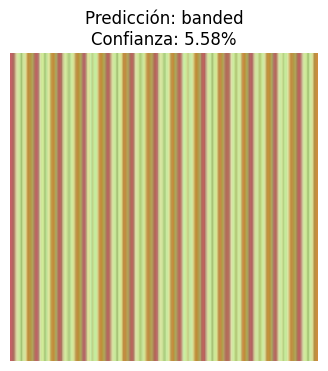

Archivo: banded_0002.jpg -> Resultado: banded (5.58%)


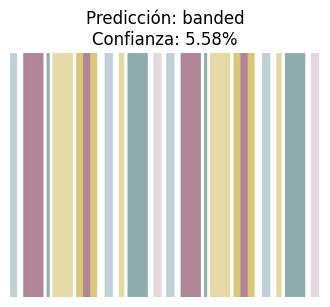

Archivo: banded_0004.jpg -> Resultado: banded (5.58%)


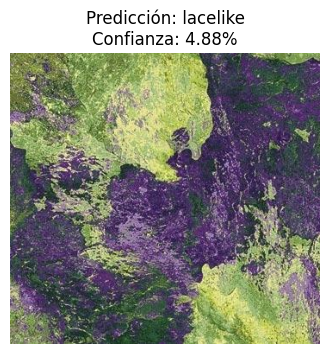

Archivo: blotchy_0018.jpg -> Resultado: lacelike (4.88%)


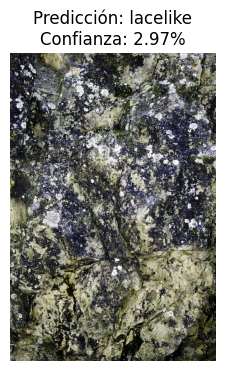

Archivo: blotchy_0027.jpg -> Resultado: lacelike (2.97%)


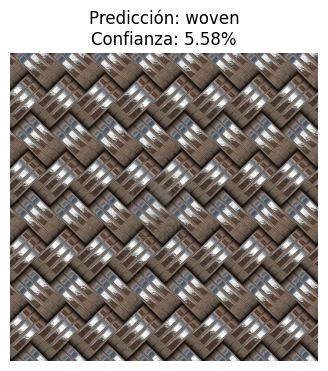

Archivo: braided_0064.jpg -> Resultado: woven (5.58%)


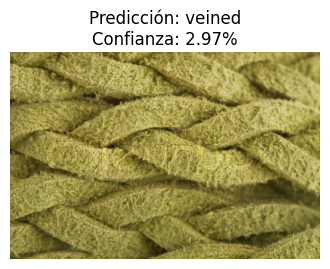

Archivo: braided_0075.jpg -> Resultado: veined (2.97%)


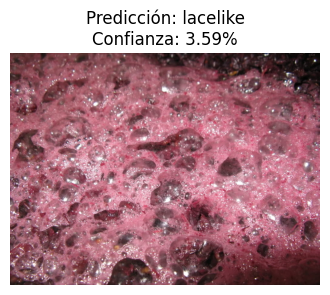

Archivo: bubbly_0048.jpg -> Resultado: lacelike (3.59%)


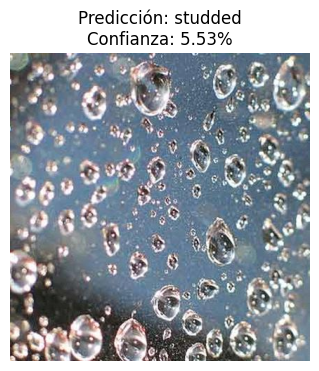

Archivo: bubbly_0053.jpg -> Resultado: studded (5.53%)


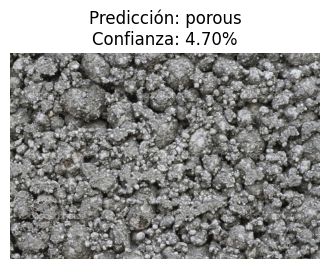

Archivo: bumpy_0067.jpg -> Resultado: porous (4.70%)


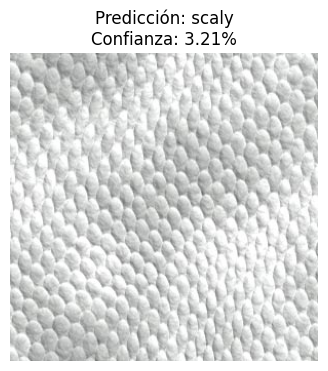

Archivo: bumpy_0079.jpg -> Resultado: scaly (3.21%)


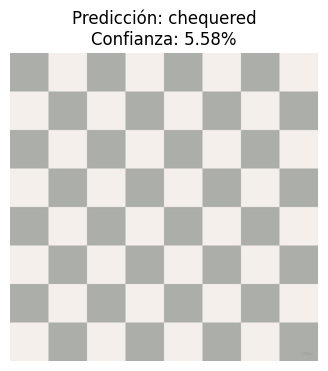

Archivo: chequered_0048.jpg -> Resultado: chequered (5.58%)


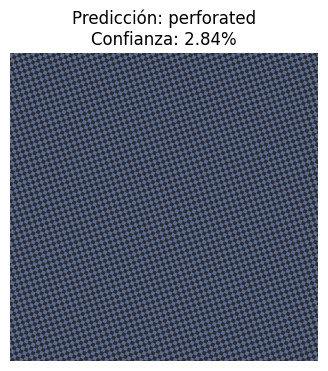

Archivo: chequered_0053.jpg -> Resultado: perforated (2.84%)


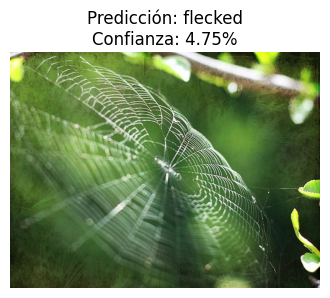

Archivo: cobwebbed_0047.jpg -> Resultado: flecked (4.75%)


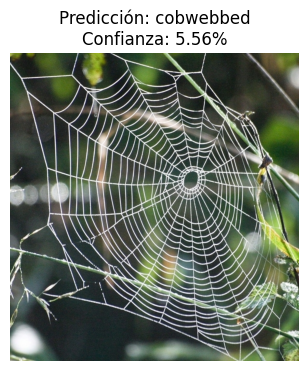

Archivo: cobwebbed_0058.jpg -> Resultado: cobwebbed (5.56%)


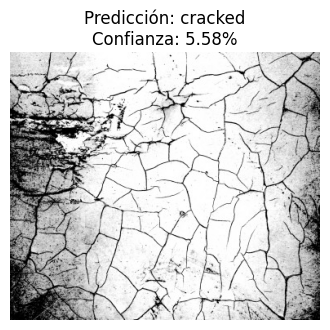

Archivo: cracked_0057.jpg -> Resultado: cracked (5.58%)


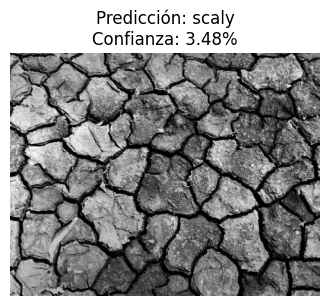

Archivo: cracked_0063.jpg -> Resultado: scaly (3.48%)


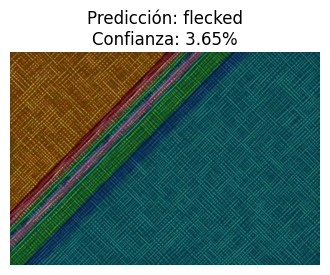

Archivo: crosshatched_0049.jpg -> Resultado: flecked (3.65%)


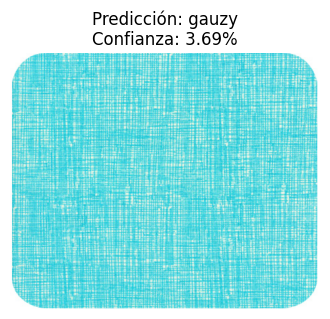

Archivo: crosshatched_0054.jpg -> Resultado: gauzy (3.69%)


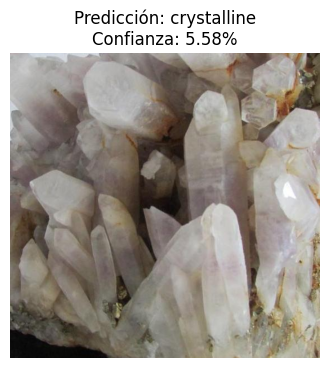

Archivo: crystalline_0112.jpg -> Resultado: crystalline (5.58%)


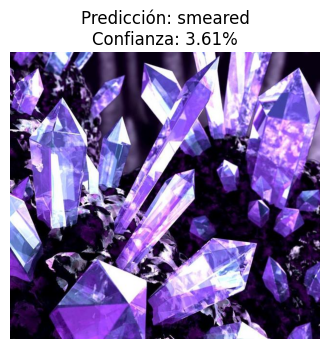

Archivo: crystalline_0117.jpg -> Resultado: smeared (3.61%)


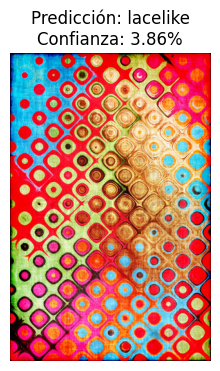

Archivo: dotted_0074.jpg -> Resultado: lacelike (3.86%)


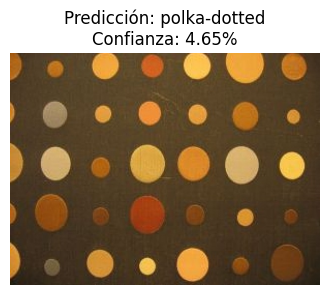

Archivo: dotted_0093.jpg -> Resultado: polka-dotted (4.65%)


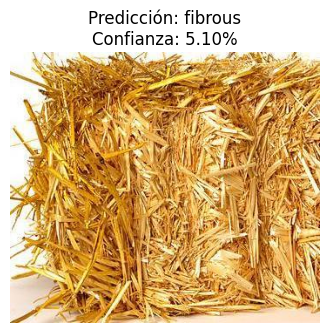

Archivo: fibrous_0108.jpg -> Resultado: fibrous (5.10%)


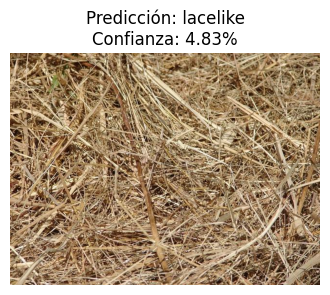

Archivo: fibrous_0113.jpg -> Resultado: lacelike (4.83%)


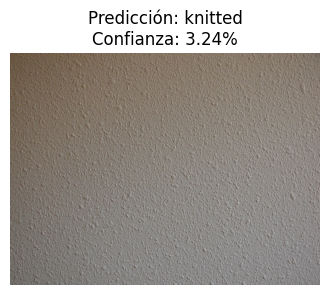

Archivo: flecked_0048.jpg -> Resultado: knitted (3.24%)


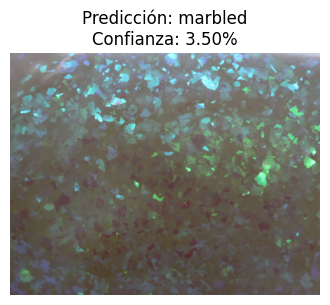

Archivo: flecked_0054.jpg -> Resultado: marbled (3.50%)


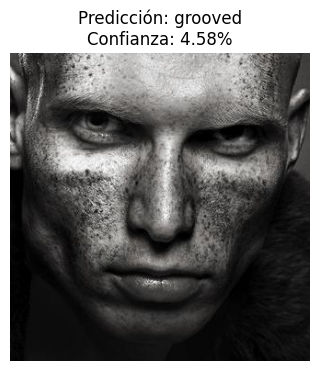

Archivo: freckled_0053.jpg -> Resultado: grooved (4.58%)


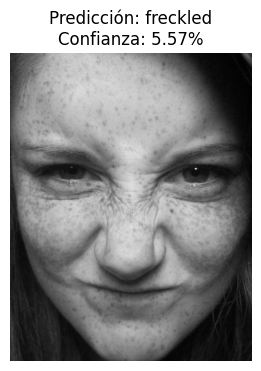

Archivo: freckled_0061.jpg -> Resultado: freckled (5.57%)


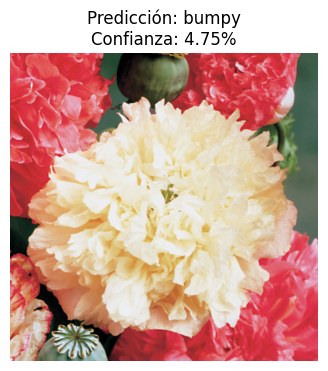

Archivo: frilly_0007.jpg -> Resultado: bumpy (4.75%)


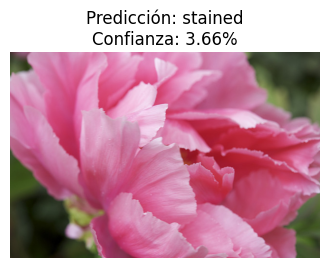

Archivo: frilly_0012.jpg -> Resultado: stained (3.66%)


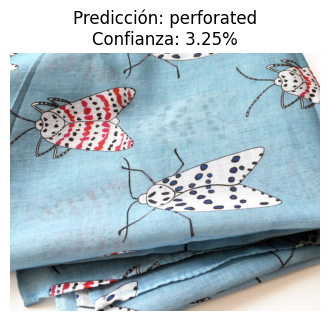

Archivo: gauzy_0084.jpg -> Resultado: perforated (3.25%)


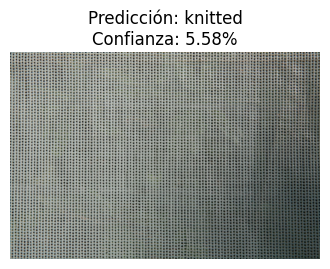

Archivo: gauzy_0091.jpg -> Resultado: knitted (5.58%)


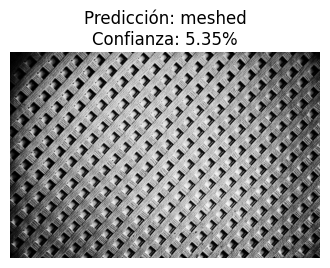

Archivo: grid_0009.jpg -> Resultado: meshed (5.35%)


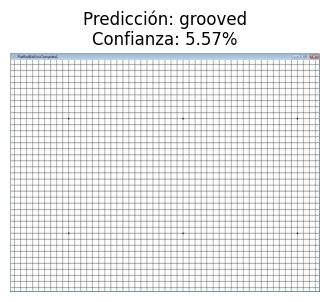

Archivo: grid_0023.jpg -> Resultado: grooved (5.57%)


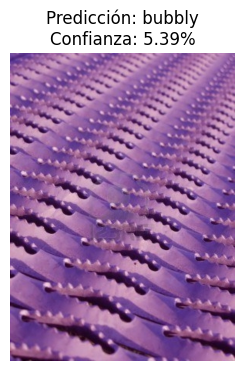

Archivo: grooved_0051.jpg -> Resultado: bubbly (5.39%)


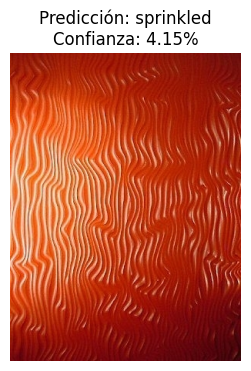

Archivo: grooved_0062.jpg -> Resultado: sprinkled (4.15%)


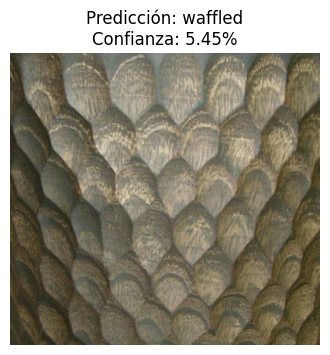

Archivo: honeycombed_0046.jpg -> Resultado: waffled (5.45%)


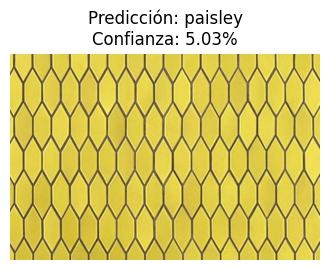

Archivo: honeycombed_0061.jpg -> Resultado: paisley (5.03%)


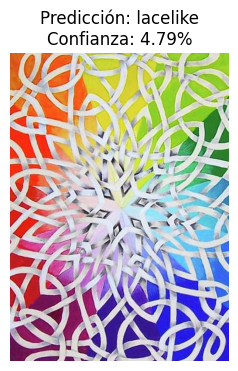

Archivo: interlaced_0069.jpg -> Resultado: lacelike (4.79%)


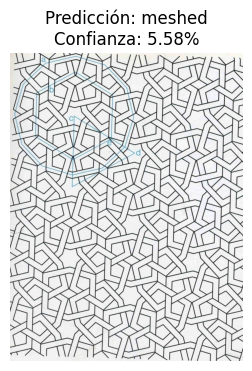

Archivo: interlaced_0087.jpg -> Resultado: meshed (5.58%)


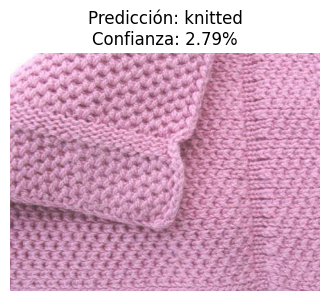

Archivo: knitted_0083.jpg -> Resultado: knitted (2.79%)


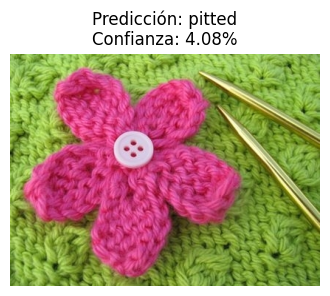

Archivo: knitted_0092.jpg -> Resultado: pitted (4.08%)


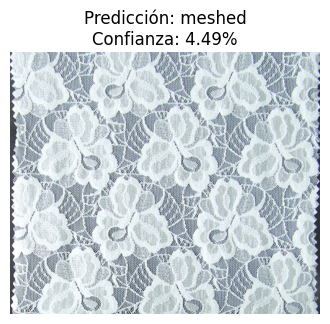

Archivo: lacelike_0007.jpg -> Resultado: meshed (4.49%)


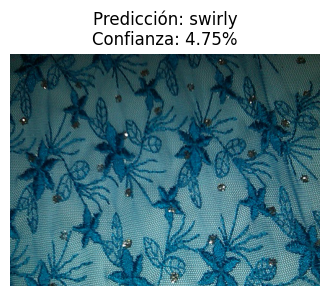

Archivo: lacelike_0012.jpg -> Resultado: swirly (4.75%)


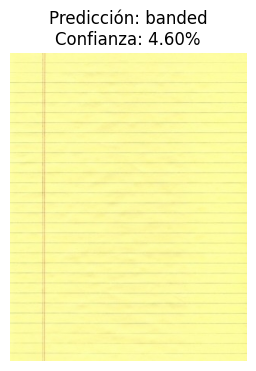

Archivo: lined_0028.jpg -> Resultado: banded (4.60%)


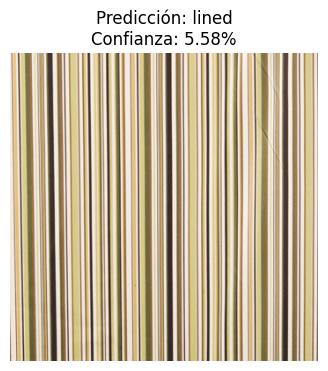

Archivo: lined_0037.jpg -> Resultado: lined (5.58%)


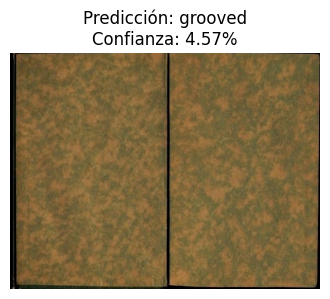

Archivo: marbled_0085.jpg -> Resultado: grooved (4.57%)


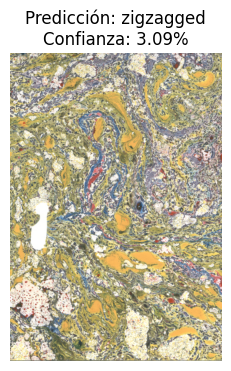

Archivo: marbled_0090.jpg -> Resultado: zigzagged (3.09%)


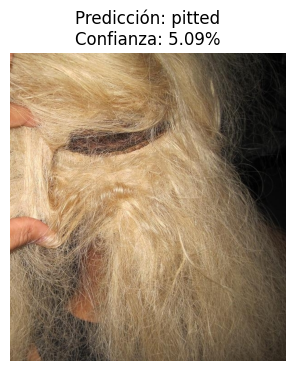

Archivo: matted_0031.jpg -> Resultado: pitted (5.09%)


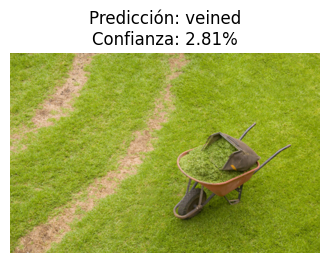

Archivo: matted_0039.jpg -> Resultado: veined (2.81%)


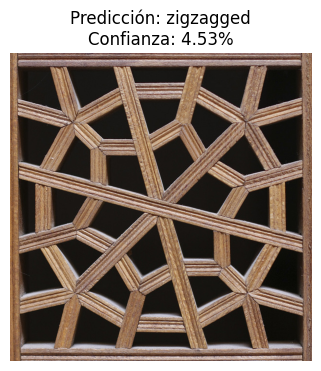

Archivo: meshed_0031.jpg -> Resultado: zigzagged (4.53%)


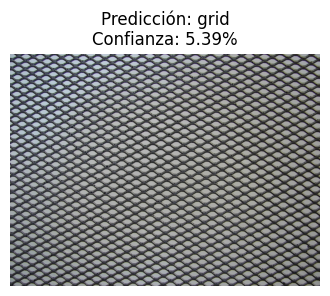

Archivo: meshed_0044.jpg -> Resultado: grid (5.39%)


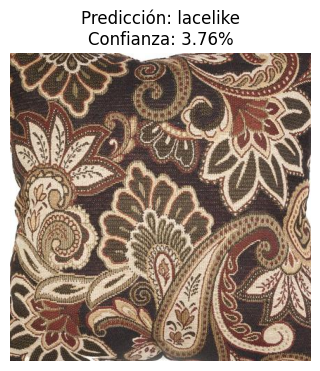

Archivo: paisley_0012.jpg -> Resultado: lacelike (3.76%)


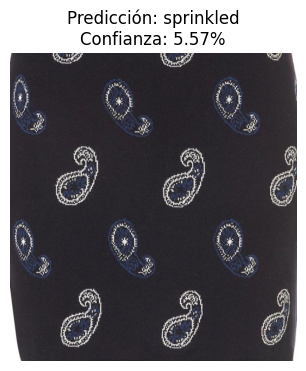

Archivo: paisley_0018.jpg -> Resultado: sprinkled (5.57%)


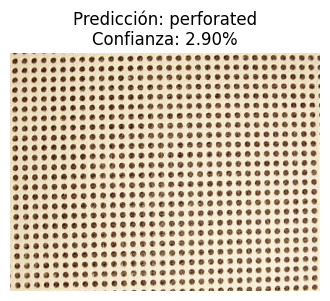

Archivo: perforated_0026.jpg -> Resultado: perforated (2.90%)


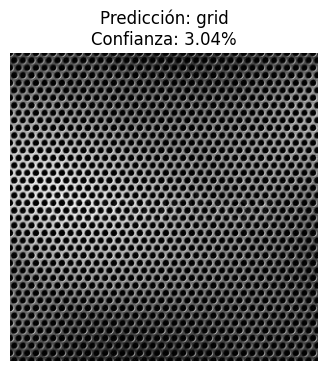

Archivo: perforated_0037.jpg -> Resultado: grid (3.04%)


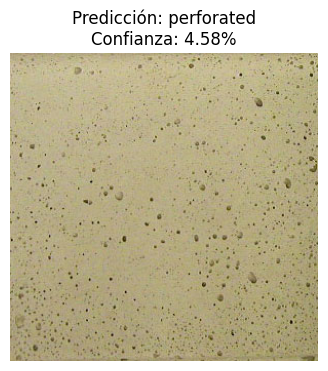

Archivo: pitted_0012.jpg -> Resultado: perforated (4.58%)


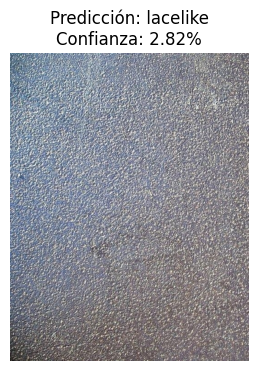

Archivo: pitted_0031.jpg -> Resultado: lacelike (2.82%)


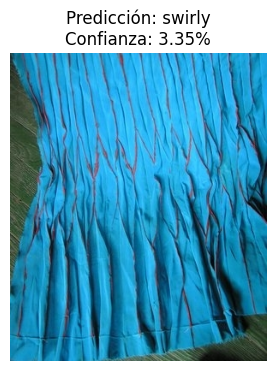

Archivo: pleated_0056.jpg -> Resultado: swirly (3.35%)


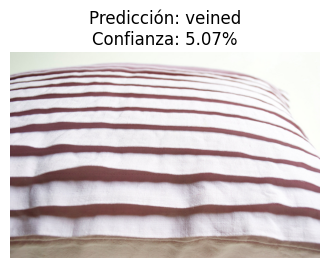

Archivo: pleated_0062.jpg -> Resultado: veined (5.07%)


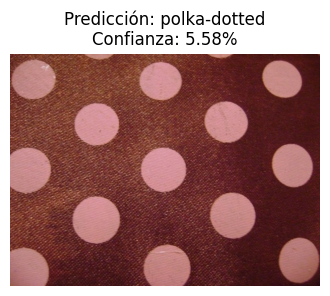

Archivo: polka-dotted_0098.jpg -> Resultado: polka-dotted (5.58%)


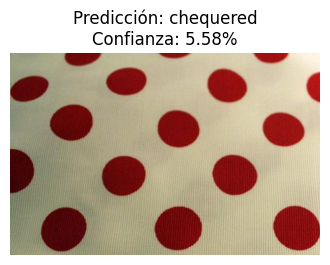

Archivo: polka-dotted_0105.jpg -> Resultado: chequered (5.58%)


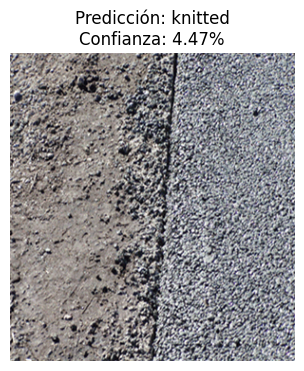

Archivo: porous_0058.jpg -> Resultado: knitted (4.47%)


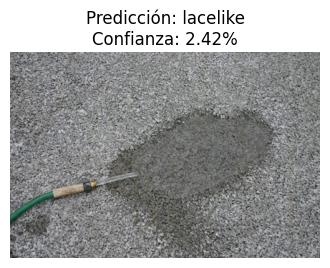

Archivo: porous_0065.jpg -> Resultado: lacelike (2.42%)


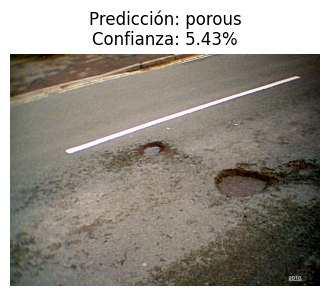

Archivo: potholed_0059.jpg -> Resultado: porous (5.43%)


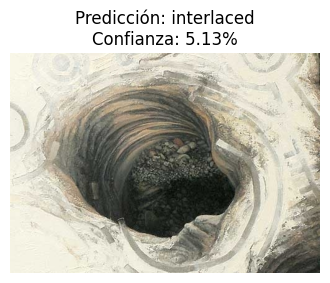

Archivo: potholed_0066.jpg -> Resultado: interlaced (5.13%)


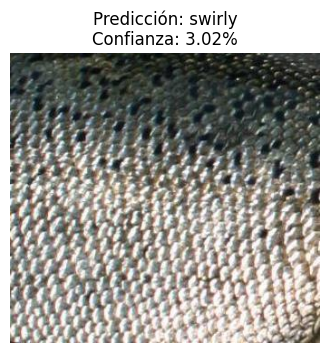

Archivo: scaly_0116.jpg -> Resultado: swirly (3.02%)


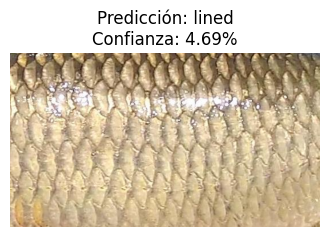

Archivo: scaly_0121.jpg -> Resultado: lined (4.69%)


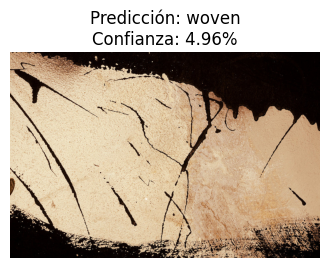

Archivo: smeared_0035.jpg -> Resultado: woven (4.96%)


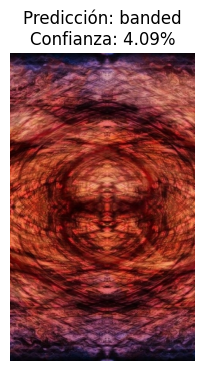

Archivo: smeared_0041.jpg -> Resultado: banded (4.09%)


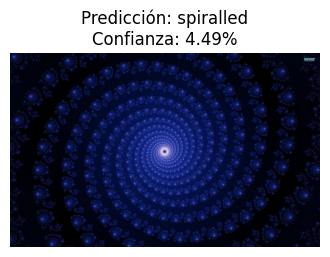

Archivo: spiralled_0028.jpg -> Resultado: spiralled (4.49%)


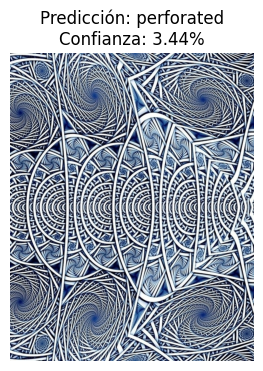

Archivo: spiralled_0033.jpg -> Resultado: perforated (3.44%)


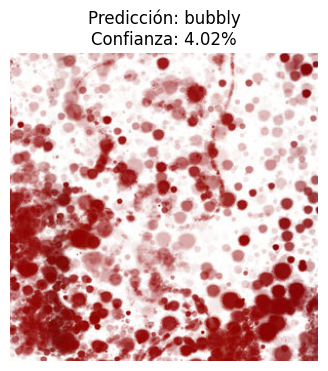

Archivo: sprinkled_0035.jpg -> Resultado: bubbly (4.02%)


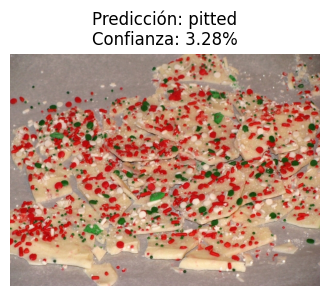

Archivo: sprinkled_0040.jpg -> Resultado: pitted (3.28%)


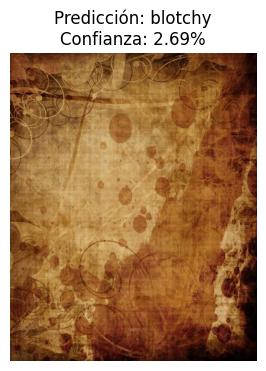

Archivo: stained_0037.jpg -> Resultado: blotchy (2.69%)


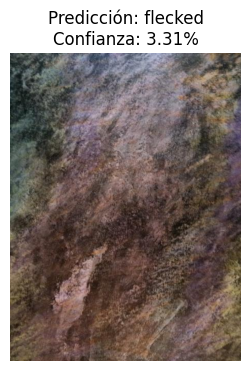

Archivo: stained_0042.jpg -> Resultado: flecked (3.31%)


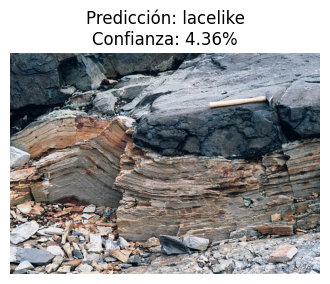

Archivo: stratified_0060.jpg -> Resultado: lacelike (4.36%)


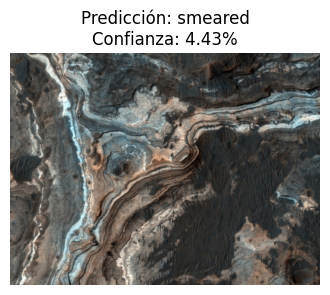

Archivo: stratified_0067.jpg -> Resultado: smeared (4.43%)


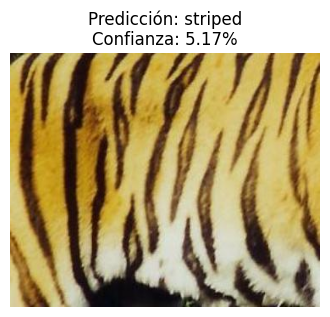

Archivo: striped_0020.jpg -> Resultado: striped (5.17%)


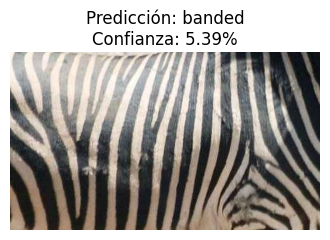

Archivo: striped_0025.jpg -> Resultado: banded (5.39%)


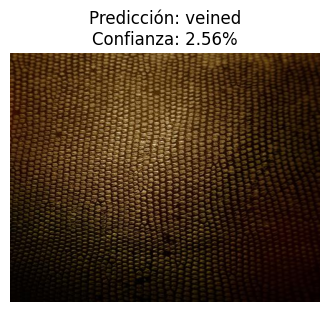

Archivo: studded_0100.jpg -> Resultado: veined (2.56%)


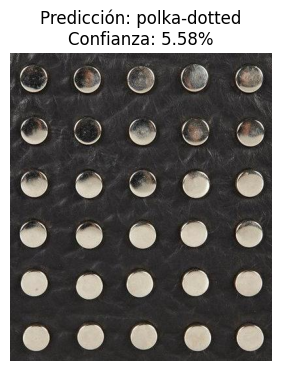

Archivo: studded_0106.jpg -> Resultado: polka-dotted (5.58%)


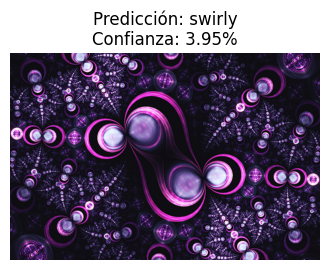

Archivo: swirly_0076.jpg -> Resultado: swirly (3.95%)


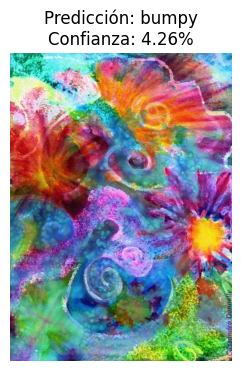

Archivo: swirly_0081.jpg -> Resultado: bumpy (4.26%)


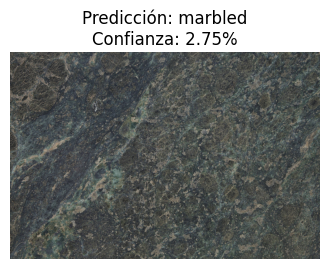

Archivo: veined_0090.jpg -> Resultado: marbled (2.75%)


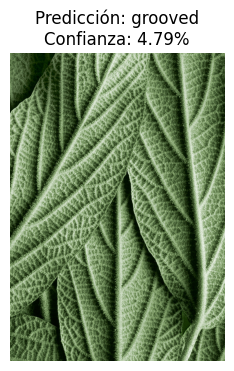

Archivo: veined_0095.jpg -> Resultado: grooved (4.79%)


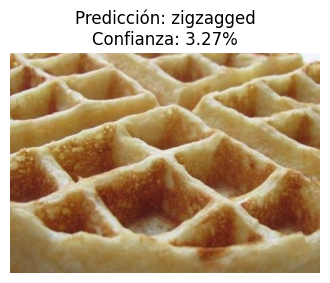

Archivo: waffled_0077.jpg -> Resultado: zigzagged (3.27%)


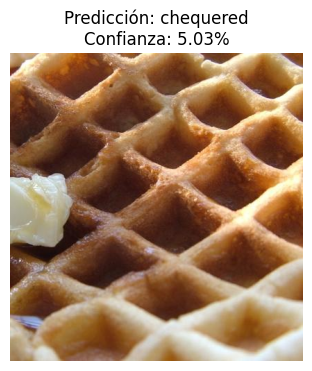

Archivo: waffled_0098.jpg -> Resultado: chequered (5.03%)


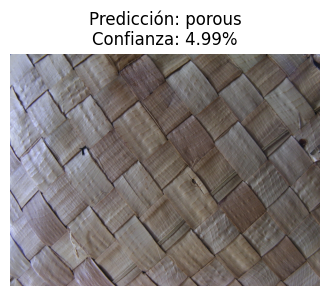

Archivo: woven_0018.jpg -> Resultado: porous (4.99%)


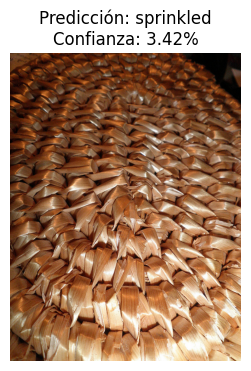

Archivo: woven_0024.jpg -> Resultado: sprinkled (3.42%)


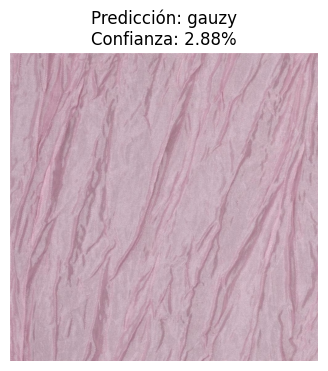

Archivo: wrinkled_0031.jpg -> Resultado: gauzy (2.88%)


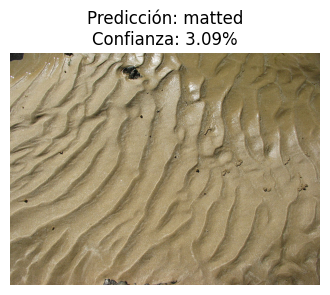

Archivo: wrinkled_0038.jpg -> Resultado: matted (3.09%)


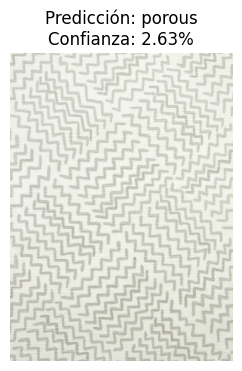

Archivo: zigzagged_0029.jpg -> Resultado: porous (2.63%)


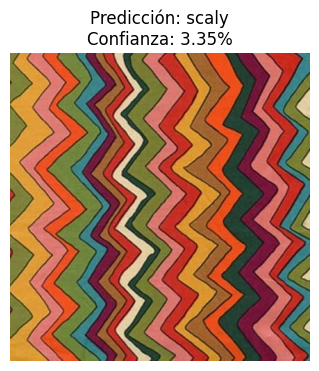

Archivo: zigzagged_0041.jpg -> Resultado: scaly (3.35%)


In [27]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import os

7
Ruta_Pruebas = r"C:/Users/gerar/Desktop/Analizador-de-Textura-main/Modelo2026/47clasesPrueba"
Imagenes_Size = (128, 128)

nombres_clases = train_ds.class_names 

def predecir_y_mostrar(ruta_imagen):
    # Cargar imagen para el modelo 
    img_modelo = image.load_img(ruta_imagen, target_size=Imagenes_Size)
    img_array = image.img_to_array(img_modelo)
    img_array = tf.expand_dims(img_array, 0) 

    # Predicción
    predicciones = model.predict(img_array, verbose=0)
    # Aplicamos softmax para obtener probabilidades 
    score = tf.nn.softmax(predicciones[0])
    
    clase_predicha = nombres_clases[np.argmax(score)]
    confianza = 100 * np.max(score)

    # Visualización 
    img_display = image.load_img(ruta_imagen) 
    plt.figure(figsize=(4, 4))
    plt.imshow(img_display)
    plt.title(f"Predicción: {clase_predicha}\nConfianza: {confianza:.2f}%")
    plt.axis('off')
    plt.show()

    return clase_predicha, confianza


print(f"Probando imágenes en: {Ruta_Pruebas}\n")


archivos = [f for f in os.listdir(Ruta_Pruebas) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

if not archivos:
    print("No se encontraron imágenes en la carpeta especificada.")
else:
    for archivo in archivos:
        ruta_completa = os.path.join(Ruta_Pruebas, archivo)
        clase, conf = predecir_y_mostrar(ruta_completa)
        print(f"Archivo: {archivo} -> Resultado: {clase} ({conf:.2f}%)")


Calculando predicciones para la matriz de confusión...


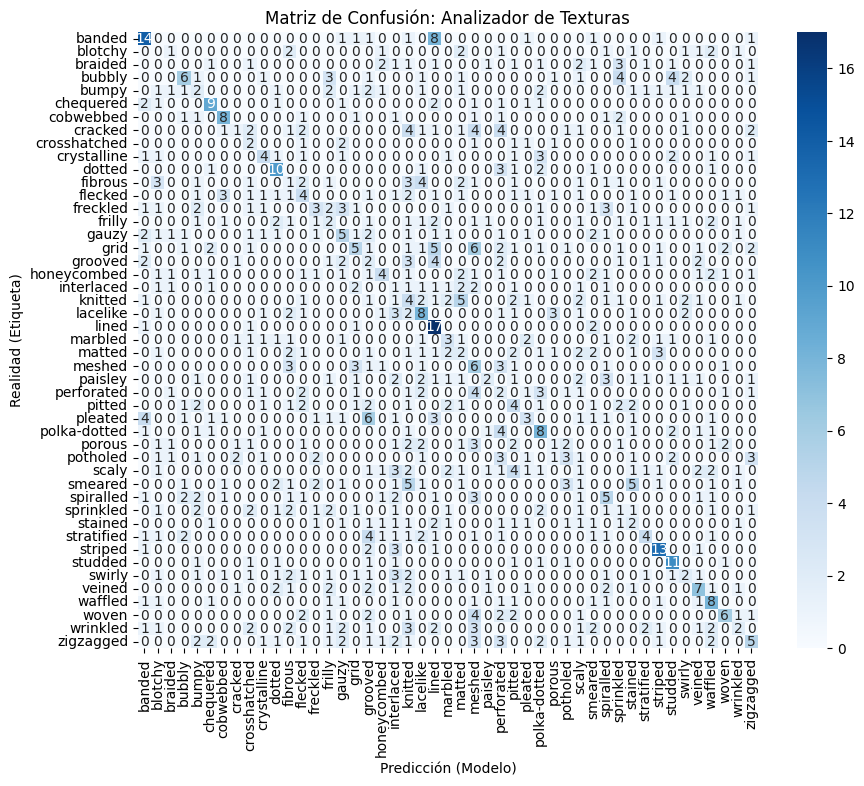


Reporte de Clasificación:
              precision    recall  f1-score   support

      banded       0.40      0.47      0.43        30
     blotchy       0.00      0.00      0.00        14
     braided       0.00      0.00      0.00        19
      bubbly       0.35      0.22      0.27        27
       bumpy       0.09      0.09      0.09        22
   chequered       0.43      0.45      0.44        20
   cobwebbed       0.47      0.42      0.44        19
     cracked       0.14      0.04      0.06        28
crosshatched       0.09      0.20      0.12        10
 crystalline       0.27      0.22      0.24        18
      dotted       0.38      0.50      0.43        20
     fibrous       0.04      0.04      0.04        24
     flecked       0.16      0.15      0.16        26
    freckled       0.23      0.13      0.17        23
      frilly       0.09      0.08      0.09        25
       gauzy       0.20      0.19      0.20        26
        grid       0.24      0.14      0.18        36


In [28]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

# 1. Obtener etiquetas reales y predicciones
y_true = []
y_pred = []

print("Calculando predicciones para la matriz de confusión...")

# Recorremos el dataset de validación
for imagenes, etiquetas in val_ds:
    preds = model.predict(imagenes, verbose=0)
    y_true.extend(etiquetas.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

# 2. Crear la matriz de confusión
cm = confusion_matrix(y_true, y_pred)
nombres_clases = train_ds.class_names

# 3. Graficar
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=nombres_clases, 
            yticklabels=nombres_clases)
plt.xlabel('Predicción (Modelo)')
plt.ylabel('Realidad (Etiqueta)')
plt.title('Matriz de Confusión: Analizador de Texturas')
plt.show()

# 4. Mostrar reporte de métricas detallado
print("\nReporte de Clasificación:")
print(classification_report(y_true, y_pred, target_names=nombres_clases))